<a href="https://colab.research.google.com/github/gopathisuresh/Health-Insurance/blob/master/Mortality_Capstone_1608.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#importing Libraries
import numpy as np 
import pandas as pd 

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
df = pd.read_csv("/content/drive/MyDrive/EDA/FinalCode/Mortality_Final.csv")
df.head()

,Patkey,ICD_Code,DX,CDS,CCI,AdmitDt,DischargeDt,DeathDt,Length of Stay in days,Length of Stay Score (L),...,No. Of visits (Value),No. Of visits (Points),CCI Value,CCI Points,LACE Score,CDS Value,Length of Survival day (Yx),30 days Mortality (Yes/No),30 days Readmission & Mortality Probability,MultiClass
0,H10008,G30.9,"ALZHEIMER'S DISEASE, UNSPECIFIED",4.0,4.0,01-02-2015,27-11-2015,24-10-2017,299,7,...,2,2,4.0,5.0,15.0,4.0,996,No,0.260,90Days
1,H10008,I10,ESSENTIAL (PRIMARY) HYPERTENSION,4.0,4.0,21-06-2017,24-10-2017,24-10-2017,125,7,...,2,2,4.0,5.0,15.0,4.0,125,No,0.260,90Days
2,H10403,N10,ACUTE PYELONEPHRITIS ...,8.0,4.0,02-09-2016,14-09-2016,16-04-2017,12,5,...,3,3,4.0,5.0,13.0,8.0,226,No,0.198,90Days
3,H10403,E10.8,TYPE 1 DIABETES MELLITUS WITH UNSPECIFIED COMP...,8.0,4.0,03-10-2016,03-11-2016,16-04-2017,31,7,...,3,3,4.0,5.0,15.0,8.0,195,No,0.260,90Days
4,H10403,E13.40,OTH DIABETES MELLITUS WITH DIABETIC NEUROPATHY...,8.0,4.0,26-03-2017,16-04-2017,16-04-2017,21,7,...,3,3,4.0,5.0,16.0,8.0,21,Yes,0.304,30Days


In [4]:
# approx 10K rows, 23 columns
print(df.shape)
print(df.info())

(10337, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10337 entries, 0 to 10336
Data columns (total 23 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Patkey                                       10337 non-null  object 
 1   ICD_Code                                     10337 non-null  object 
 2   DX                                           10337 non-null  object 
 3   CDS                                          8963 non-null   float64
 4   CCI                                          8963 non-null   float64
 5   AdmitDt                                      10336 non-null  object 
 6   DischargeDt                                  10336 non-null  object 
 7   DeathDt                                      7863 non-null   object 
 8   Length of Stay in days                       10337 non-null  int64  
 9   Length of Stay Score (L)                     10337 non-null 

In [5]:
df.describe()

,CDS,CCI,Length of Stay in days,Length of Stay Score (L),Acute (Emergent) Admission (A)- Points,No. Of visits (Value),No. Of visits (Points),CCI Value,CCI Points,LACE Score,CDS Value,30 days Readmission & Mortality Probability
count,8963.000000,8963.000000,10337.000000,10337.000000,10337.000000,10337.000000,10337.000000,8963.000000,8963.000000,8963.000000,8963.000000,8963.000000
mean,6.459221,4.225594,89.877044,5.647577,0.865532,1.199671,1.198123,4.225594,3.278924,11.090148,6.459221,0.158602
std,7.584530,3.647211,144.009428,1.974369,0.660932,0.507860,0.497113,3.647211,1.732202,2.872993,7.584530,0.066223
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2.000000,0.000000,0.030000
25%,1.000000,2.000000,7.000000,5.000000,1.000000,1.000000,1.000000,2.000000,2.000000,9.000000,1.000000,0.103000
50%,4.000000,3.000000,26.000000,7.000000,1.000000,1.000000,1.000000,3.000000,3.000000,11.000000,4.000000,0.144000
75%,9.000000,6.000000,106.000000,7.000000,1.000000,1.000000,1.000000,6.000000,5.000000,14.000000,9.000000,0.230000
max,68.000000,42.000000,1257.000000,7.000000,3.000000,6.000000,4.000000,42.000000,5.000000,19.000000,68.000000,0.437000


In [6]:
# Convert Object Data type to Datatime Data Types for "AdmitDt", "DischargeDt" and "DeathDt"
df['AdmitDt'] = pd.to_datetime(df['AdmitDt'], errors='coerce')
df['DischargeDt'] = pd.to_datetime(df['DischargeDt'], errors='coerce')
df['DeathDt'] = pd.to_datetime(df['DeathDt'], errors='coerce')

In [7]:
# approx 10K rows, 23 columns
print(df.shape)
print(df.info())

(10337, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10337 entries, 0 to 10336
Data columns (total 23 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   Patkey                                       10337 non-null  object        
 1   ICD_Code                                     10337 non-null  object        
 2   DX                                           10337 non-null  object        
 3   CDS                                          8963 non-null   float64       
 4   CCI                                          8963 non-null   float64       
 5   AdmitDt                                      10336 non-null  datetime64[ns]
 6   DischargeDt                                  10336 non-null  datetime64[ns]
 7   DeathDt                                      7863 non-null   datetime64[ns]
 8   Length of Stay in days                       10337 non-null  int

## Identifying Missing Values

In [8]:
# isnull()
df.isnull()

,Patkey,ICD_Code,DX,CDS,CCI,AdmitDt,DischargeDt,DeathDt,Length of Stay in days,Length of Stay Score (L),...,No. Of visits (Value),No. Of visits (Points),CCI Value,CCI Points,LACE Score,CDS Value,Length of Survival day (Yx),30 days Mortality (Yes/No),30 days Readmission & Mortality Probability,MultiClass
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10332,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
10333,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
10334,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
10335,False,False,False,True,True,False,False,False,False,False,...,False,False,True,True,True,True,False,False,True,False


In [9]:
# summing up the missing values (column-wise)
df.isnull().sum()

Patkey                                            0
ICD_Code                                          0
DX                                                0
CDS                                            1374
CCI                                            1374
AdmitDt                                           1
DischargeDt                                       1
DeathDt                                        2474
Length of Stay in days                            0
Length of Stay Score (L)                          0
PATIENT'S HOME/RESIDENCE                       7291
Acute (Emergent) Admission                        0
Acute (Emergent) Admission (A)- Points            0
No. Of visits (Value)                             0
No. Of visits (Points)                            0
CCI Value                                      1374
CCI Points                                     1374
LACE Score                                     1374
CDS Value                                      1374
Length of Su

In [10]:
# columns having at least one missing value
df.isnull().any()

# above is equivalent to axis=0 (by default, any() operates on columns)
df.isnull().any(axis=0)

Patkey                                         False
ICD_Code                                       False
DX                                             False
CDS                                             True
CCI                                             True
AdmitDt                                         True
DischargeDt                                     True
DeathDt                                         True
Length of Stay in days                         False
Length of Stay Score (L)                       False
PATIENT'S HOME/RESIDENCE                        True
Acute (Emergent) Admission                     False
Acute (Emergent) Admission (A)- Points         False
No. Of visits (Value)                          False
No. Of visits (Points)                         False
CCI Value                                       True
CCI Points                                      True
LACE Score                                      True
CDS Value                                     

In [11]:
# rows having at least one missing value
df.isnull().any(axis=1)

0         True
1         True
2        False
3        False
4         True
         ...  
10332    False
10333    False
10334     True
10335     True
10336     True
Length: 10337, dtype: bool

In [12]:
# rows having all missing values
df.isnull().all(axis=1)

0        False
1        False
2        False
3        False
4        False
         ...  
10332    False
10333    False
10334    False
10335    False
10336    False
Length: 10337, dtype: bool

In [13]:
# sum of misisng values in each row
df.isnull().sum(axis=1)

0        1
1        1
2        0
3        0
4        1
        ..
10332    0
10333    0
10334    1
10335    7
10336    1
Length: 10337, dtype: int64

In [14]:
# summing up the missing values (column-wise)
round(100*(df.isnull().sum()/len(df.index)), 2)

Patkey                                          0.00
ICD_Code                                        0.00
DX                                              0.00
CDS                                            13.29
CCI                                            13.29
AdmitDt                                         0.01
DischargeDt                                     0.01
DeathDt                                        23.93
Length of Stay in days                          0.00
Length of Stay Score (L)                        0.00
PATIENT'S HOME/RESIDENCE                       70.53
Acute (Emergent) Admission                      0.00
Acute (Emergent) Admission (A)- Points          0.00
No. Of visits (Value)                           0.00
No. Of visits (Points)                          0.00
CCI Value                                      13.29
CCI Points                                     13.29
LACE Score                                     13.29
CDS Value                                     

In [15]:
df["PATIENT'S HOME/RESIDENCE"]

0                             NaN
1                             NaN
2        PATIENT'S HOME/RESIDENCE
3        PATIENT'S HOME/RESIDENCE
4                             NaN
                   ...           
10332          INPATIENT HOSPITAL
10333    SKILLED NURSING FACILITY
10334                         NaN
10335    PATIENT'S HOME/RESIDENCE
10336                         NaN
Name: PATIENT'S HOME/RESIDENCE, Length: 10337, dtype: object

In [16]:
# removing NaN CDS rows
df = df[~np.isnan(df['CDS'])]

round(100*(df.isnull().sum()/len(df.index)), 2)

Patkey                                          0.00
ICD_Code                                        0.00
DX                                              0.00
CDS                                             0.00
CCI                                             0.00
AdmitDt                                         0.00
DischargeDt                                     0.00
DeathDt                                        24.98
Length of Stay in days                          0.00
Length of Stay Score (L)                        0.00
PATIENT'S HOME/RESIDENCE                       70.00
Acute (Emergent) Admission                      0.00
Acute (Emergent) Admission (A)- Points          0.00
No. Of visits (Value)                           0.00
No. Of visits (Points)                          0.00
CCI Value                                       0.00
CCI Points                                      0.00
LACE Score                                      0.00
CDS Value                                     

In [17]:
df.to_csv('Mortality_Survival_Days.csv')

In [18]:
df['Length of Survival day (Yx)']

0        996
1        125
2        226
3        195
4         21
        ... 
10331    745
10332    534
10333      7
10334      1
10336     58
Name: Length of Survival day (Yx), Length: 8963, dtype: object

In [19]:
# Get a series of unique values in column 'Age' of the dataframe
uniqueValues = df['Length of Survival day (Yx)'].unique()
print(uniqueValues)


['996' '125' '226' '195' '21' '399' '31' '653' '20' '353' '14' '11' '33'
 nan '390' '279' '203' '64' '37' '3' '13' '36' '52' '492' '18' '2' '183'
 '54' '27' '270' '15' '281' '62' '30' '196' '7' '103' '495' '32' '91' '38'
 '101' '403' '16' '429' '150' '405' '1' '254' '173' '170' '252' '47' '393'
 '49' '641' '559' '40' '5' '51' '840' '206' '6' '17' '463' '242' '554'
 '25' '419' '309' '420' '298' '269' '533' '239' '524' '967' '287' '182'
 '698' '437' '82' '336' '396' '497' '500' '207' '1303' '478' '283' '622'
 '774' '354' '702' '198' '443' '233' '547' '278' '180' '318' '1028' '177'
 '544' '435' '265' '197' '1048' '406' '289' '220' '480' '756' '510' '255'
 '321' '368' '1174' '245' '346' '703' '191' '650' '288' '217' '228' '214'
 '338' '8' '10' '212' '247' '262' '572' '552' '476' '455' '1484' '23'
 '514' '310' '69' '238' '266' '673' '97' '374' '499' '339' '304' '644'
 '834' '375' '502' '235' '131' '208' '184' '299' '359' '1111' '925' '457'
 '1161' '110' '952' '848' '172' '105' '96' '90' '18

In [20]:
df.drop(df.index[df['Length of Survival day (Yx)'] == '#VALUE!'], inplace = True)

In [21]:

round(100*(df.isnull().sum()/len(df.index)), 2)

Patkey                                          0.00
ICD_Code                                        0.00
DX                                              0.00
CDS                                             0.00
CCI                                             0.00
AdmitDt                                         0.00
DischargeDt                                     0.00
DeathDt                                        18.15
Length of Stay in days                          0.00
Length of Stay Score (L)                        0.00
PATIENT'S HOME/RESIDENCE                       70.58
Acute (Emergent) Admission                      0.00
Acute (Emergent) Admission (A)- Points          0.00
No. Of visits (Value)                           0.00
No. Of visits (Points)                          0.00
CCI Value                                       0.00
CCI Points                                      0.00
LACE Score                                      0.00
CDS Value                                     

In [22]:
pd.options.display.max_rows = None
df['Length of Survival day (Yx)']


0         996
1         125
2         226
3         195
4          21
5         399
8          31
11        653
12         20
13        353
14         14
15         11
16         33
17        125
18        NaN
19        NaN
20        390
21        279
22        203
24         64
25         37
26        NaN
27          3
28        NaN
29         13
31          3
32         36
33        NaN
34         52
35        492
38         18
40          2
41        183
43         54
44          3
45         27
47        270
49         15
50         11
51        281
52          2
53        NaN
54         62
56         30
58        NaN
59        196
60          7
63        103
64        495
66        NaN
68         31
69         32
72         91
73         38
76        NaN
77        NaN
78          7
79        101
80        403
81         16
82        429
83        150
84        NaN
85        NaN
86        405
87          1
89        254
90        NaN
91        NaN
92        NaN
93          3
95    

In [23]:
pd.options.display.max_rows = None
df

,Patkey,ICD_Code,DX,CDS,CCI,AdmitDt,DischargeDt,DeathDt,Length of Stay in days,Length of Stay Score (L),...,No. Of visits (Value),No. Of visits (Points),CCI Value,CCI Points,LACE Score,CDS Value,Length of Survival day (Yx),30 days Mortality (Yes/No),30 days Readmission & Mortality Probability,MultiClass
0,H10008,G30.9,"ALZHEIMER'S DISEASE, UNSPECIFIED",4.0,4.0,2015-01-02,2015-11-27,2017-10-24,299,7,...,2,2,4.0,5.0,15.0,4.0,996,No,0.260,90Days
1,H10008,I10,ESSENTIAL (PRIMARY) HYPERTENSION,4.0,4.0,2017-06-21,2017-10-24,2017-10-24,125,7,...,2,2,4.0,5.0,15.0,4.0,125,No,0.260,90Days
2,H10403,N10,ACUTE PYELONEPHRITIS ...,8.0,4.0,2016-02-09,2016-09-14,2017-04-16,12,5,...,3,3,4.0,5.0,13.0,8.0,226,No,0.198,90Days
3,H10403,E10.8,TYPE 1 DIABETES MELLITUS WITH UNSPECIFIED COMP...,8.0,4.0,2016-03-10,2016-03-11,2017-04-16,31,7,...,3,3,4.0,5.0,15.0,8.0,195,No,0.260,90Days
4,H10403,E13.40,OTH DIABETES MELLITUS WITH DIABETIC NEUROPATHY...,8.0,4.0,2017-03-26,2017-04-16,2017-04-16,21,7,...,3,3,4.0,5.0,16.0,8.0,21,Yes,0.304,30Days
5,H10438,C25.9,"MALIGNANT NEOPLASM OF PANCREAS, UNSPECIFIED",6.0,6.0,2016-09-26,2017-10-30,2017-10-30,399,7,...,2,2,6.0,5.0,14.0,6.0,399,No,0.230,90Days
8,H10630,I73.9,"PERIPHERAL VASCULAR DISEASE, UNSPECIFIED",7.0,8.0,2016-05-11,2016-06-12,2016-06-12,31,7,...,1,1,8.0,5.0,14.0,7.0,31,No,0.230,60Days
11,H10807,0,UNKNOWN DIAGNOSIS,2.0,3.0,2016-01-10,2018-07-16,2018-07-16,653,7,...,1,1,3.0,3.0,12.0,2.0,653,No,0.170,90Days
12,H10871,I25.10,ATHSCL HEART DISEASE OF NATIVE CORONARY ARTERY...,0.0,5.0,2016-11-16,2016-06-12,2016-06-12,20,7,...,1,1,5.0,5.0,13.0,0.0,20,Yes,0.198,30Days
13,H10884,G30.9,"ALZHEIMER'S DISEASE, UNSPECIFIED",3.0,2.0,2016-11-05,2017-02-28,2017-04-29,293,7,...,2,2,2.0,2.0,12.0,3.0,353,No,0.170,90Days


In [24]:
# Remove two columns name is 'PATIENT'S HOME/RESIDENCE' and '30 days Mortality (Yes/No)'
df=df.drop(["PATIENT'S HOME/RESIDENCE", "30 days Mortality (Yes/No)", "CDS","CCI"], axis = 1)

In [25]:
print(df.shape)
print(df.info())

(8215, 19)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8215 entries, 0 to 10336
Data columns (total 19 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   Patkey                                       8215 non-null   object        
 1   ICD_Code                                     8215 non-null   object        
 2   DX                                           8215 non-null   object        
 3   AdmitDt                                      8215 non-null   datetime64[ns]
 4   DischargeDt                                  8215 non-null   datetime64[ns]
 5   DeathDt                                      6724 non-null   datetime64[ns]
 6   Length of Stay in days                       8215 non-null   int64         
 7   Length of Stay Score (L)                     8215 non-null   int64         
 8   Acute (Emergent) Admission                   8215 non-null   objec

In [26]:
#df =df.dropna(subset = ["DeathDt"], inplace=True)

In [27]:
print(df.shape)
print(df.info())

(8215, 19)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8215 entries, 0 to 10336
Data columns (total 19 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   Patkey                                       8215 non-null   object        
 1   ICD_Code                                     8215 non-null   object        
 2   DX                                           8215 non-null   object        
 3   AdmitDt                                      8215 non-null   datetime64[ns]
 4   DischargeDt                                  8215 non-null   datetime64[ns]
 5   DeathDt                                      6724 non-null   datetime64[ns]
 6   Length of Stay in days                       8215 non-null   int64         
 7   Length of Stay Score (L)                     8215 non-null   int64         
 8   Acute (Emergent) Admission                   8215 non-null   objec

In [28]:
# If columns contains NaN, remove that rows
nan_value = float("NaN")
df.replace("", nan_value, inplace=True)
df.dropna(subset = ["DeathDt"], inplace=True)

In [29]:
print(df.shape)
print(df.info())

(6724, 19)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 6724 entries, 0 to 10336
Data columns (total 19 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   Patkey                                       6724 non-null   object        
 1   ICD_Code                                     6724 non-null   object        
 2   DX                                           6724 non-null   object        
 3   AdmitDt                                      6724 non-null   datetime64[ns]
 4   DischargeDt                                  6724 non-null   datetime64[ns]
 5   DeathDt                                      6724 non-null   datetime64[ns]
 6   Length of Stay in days                       6724 non-null   int64         
 7   Length of Stay Score (L)                     6724 non-null   int64         
 8   Acute (Emergent) Admission                   6724 non-null   objec

In [30]:
#df.to_csv('mortality.csv')

In [31]:
mortality = pd.read_csv("/content/drive/MyDrive/EDA/FinalCode/mortality.csv")
mortality.head()

,Patkey,ICD_Code,DX,AdmitDt,DischargeDt,DeathDt,Length_Stay,Length_Stay_Score,Acute_Admission,Acute_AdmissionPoints,Visits,Visits_Points,CCI_Value,CCI_Points,LACE_Score,CDS_Value,Survival_Days,30days_Probability,Multi_Class
0,H10008,G30.9,"ALZHEIMER'S DISEASE, UNSPECIFIED",02-01-2015,27-11-2015,24-10-2017,299,7,FALSE,1,2,2,4,5,15,4,996,0.260,90Days
1,H10009,I10,ESSENTIAL (PRIMARY) HYPERTENSION,21-06-2017,24-10-2017,24-10-2017,125,7,FALSE,1,2,2,4,5,15,4,125,0.260,90Days
2,H10403,N10,ACUTE PYELONEPHRITIS ...,09-02-2016,14-09-2016,16-04-2017,12,5,Non-Acute,0,3,3,4,5,13,8,226,0.198,90Days
3,H10404,E10.8,TYPE 1 DIABETES MELLITUS WITH UNSPECIFIED COMP...,10-03-2016,11-03-2016,16-04-2017,31,7,Non-Acute,0,3,3,4,5,15,8,195,0.260,90Days
4,H10403,E13.40,OTH DIABETES MELLITUS WITH DIABETIC NEUROPATHY...,26-03-2017,16-04-2017,16-04-2017,21,7,FALSE,1,3,3,4,5,16,8,21,0.304,30Days


In [32]:
# approx 23k rows, 21 columns
print(mortality.shape)
print(mortality.info())

(6724, 19)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Patkey                 6724 non-null   object 
 1   ICD_Code               6724 non-null   object 
 2   DX                     6724 non-null   object 
 3   AdmitDt                6724 non-null   object 
 4   DischargeDt            6724 non-null   object 
 5   DeathDt                6724 non-null   object 
 6   Length_Stay            6724 non-null   int64  
 7   Length_Stay_Score      6724 non-null   int64  
 8   Acute_Admission        6724 non-null   object 
 9   Acute_AdmissionPoints  6724 non-null   int64  
 10  Visits                 6724 non-null   int64  
 11  Visits_Points          6724 non-null   int64  
 12  CCI_Value              6724 non-null   int64  
 13  CCI_Points             6724 non-null   int64  
 14  LACE_Score             6724 non-null   int64 

In [33]:
mortality=mortality.drop(["Acute_Admission", "Patkey"], axis = 1)

In [34]:
# Convert Object Data type to Datatime Data Types for "AdmitDt", "DischargeDt" and "DeathDt"
#df['AdmitDt'] = pd.to_datetime(mortality['AdmitDt'], errors='coerce')
#df['DischargeDt'] = pd.to_datetime(mortality['DischargeDt'], errors='coerce')
#df['DeathDt'] = pd.to_datetime(mortality['DeathDt'], errors='coerce')

In [35]:
print(mortality.shape)
print(mortality.info())

(6724, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ICD_Code               6724 non-null   object 
 1   DX                     6724 non-null   object 
 2   AdmitDt                6724 non-null   object 
 3   DischargeDt            6724 non-null   object 
 4   DeathDt                6724 non-null   object 
 5   Length_Stay            6724 non-null   int64  
 6   Length_Stay_Score      6724 non-null   int64  
 7   Acute_AdmissionPoints  6724 non-null   int64  
 8   Visits                 6724 non-null   int64  
 9   Visits_Points          6724 non-null   int64  
 10  CCI_Value              6724 non-null   int64  
 11  CCI_Points             6724 non-null   int64  
 12  LACE_Score             6724 non-null   int64  
 13  CDS_Value              6724 non-null   int64  
 14  Survival_Days          6724 non-null   int64 

## Analyzing Individual Feature Patterns using Visualization

In [36]:

import matplotlib.pyplot as plt 
import seaborn as sns
import missingno
import missingno as msno
%matplotlib inline

In [37]:
#!pip install missingno

In [38]:
mortality.describe()

,Length_Stay,Length_Stay_Score,Acute_AdmissionPoints,Visits,Visits_Points,CCI_Value,CCI_Points,LACE_Score,CDS_Value,Survival_Days,30days_Probability
count,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000
mean,80.118977,5.497174,0.874777,1.159726,1.158834,4.183373,3.270821,10.801606,6.143218,91.891136,0.152086
std,135.727300,2.022370,0.673168,0.453137,0.446509,3.583452,1.730884,2.915676,7.026978,164.265316,0.065161
min,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.030000
25%,6.000000,4.000000,1.000000,1.000000,1.000000,2.000000,2.000000,9.000000,1.000000,6.000000,0.103000
50%,20.000000,7.000000,1.000000,1.000000,1.000000,3.000000,3.000000,11.000000,4.000000,21.000000,0.144000
75%,90.000000,7.000000,1.000000,1.000000,1.000000,6.000000,5.000000,13.000000,9.000000,99.000000,0.198000
max,1257.000000,7.000000,3.000000,5.000000,4.000000,42.000000,5.000000,19.000000,66.000000,1526.000000,0.437000


In [39]:
mortality.head()

,ICD_Code,DX,AdmitDt,DischargeDt,DeathDt,Length_Stay,Length_Stay_Score,Acute_AdmissionPoints,Visits,Visits_Points,CCI_Value,CCI_Points,LACE_Score,CDS_Value,Survival_Days,30days_Probability,Multi_Class
0,G30.9,"ALZHEIMER'S DISEASE, UNSPECIFIED",02-01-2015,27-11-2015,24-10-2017,299,7,1,2,2,4,5,15,4,996,0.260,90Days
1,I10,ESSENTIAL (PRIMARY) HYPERTENSION,21-06-2017,24-10-2017,24-10-2017,125,7,1,2,2,4,5,15,4,125,0.260,90Days
2,N10,ACUTE PYELONEPHRITIS ...,09-02-2016,14-09-2016,16-04-2017,12,5,0,3,3,4,5,13,8,226,0.198,90Days
3,E10.8,TYPE 1 DIABETES MELLITUS WITH UNSPECIFIED COMP...,10-03-2016,11-03-2016,16-04-2017,31,7,0,3,3,4,5,15,8,195,0.260,90Days
4,E13.40,OTH DIABETES MELLITUS WITH DIABETIC NEUROPATHY...,26-03-2017,16-04-2017,16-04-2017,21,7,1,3,3,4,5,16,8,21,0.304,30Days


In [40]:
mortality.head()

,ICD_Code,DX,AdmitDt,DischargeDt,DeathDt,Length_Stay,Length_Stay_Score,Acute_AdmissionPoints,Visits,Visits_Points,CCI_Value,CCI_Points,LACE_Score,CDS_Value,Survival_Days,30days_Probability,Multi_Class
0,G30.9,"ALZHEIMER'S DISEASE, UNSPECIFIED",02-01-2015,27-11-2015,24-10-2017,299,7,1,2,2,4,5,15,4,996,0.260,90Days
1,I10,ESSENTIAL (PRIMARY) HYPERTENSION,21-06-2017,24-10-2017,24-10-2017,125,7,1,2,2,4,5,15,4,125,0.260,90Days
2,N10,ACUTE PYELONEPHRITIS ...,09-02-2016,14-09-2016,16-04-2017,12,5,0,3,3,4,5,13,8,226,0.198,90Days
3,E10.8,TYPE 1 DIABETES MELLITUS WITH UNSPECIFIED COMP...,10-03-2016,11-03-2016,16-04-2017,31,7,0,3,3,4,5,15,8,195,0.260,90Days
4,E13.40,OTH DIABETES MELLITUS WITH DIABETIC NEUROPATHY...,26-03-2017,16-04-2017,16-04-2017,21,7,1,3,3,4,5,16,8,21,0.304,30Days


In [41]:
print(mortality.shape)
print(mortality.info())


(6724, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ICD_Code               6724 non-null   object 
 1   DX                     6724 non-null   object 
 2   AdmitDt                6724 non-null   object 
 3   DischargeDt            6724 non-null   object 
 4   DeathDt                6724 non-null   object 
 5   Length_Stay            6724 non-null   int64  
 6   Length_Stay_Score      6724 non-null   int64  
 7   Acute_AdmissionPoints  6724 non-null   int64  
 8   Visits                 6724 non-null   int64  
 9   Visits_Points          6724 non-null   int64  
 10  CCI_Value              6724 non-null   int64  
 11  CCI_Points             6724 non-null   int64  
 12  LACE_Score             6724 non-null   int64  
 13  CDS_Value              6724 non-null   int64  
 14  Survival_Days          6724 non-null   int64 

In [42]:
# Numerical Features in the Dataset
numeric_features = mortality.select_dtypes(include=[np.number])

numeric_features.columns

Index(['Length_Stay', 'Length_Stay_Score', 'Acute_AdmissionPoints', 'Visits',
       'Visits_Points', 'CCI_Value', 'CCI_Points', 'LACE_Score', 'CDS_Value',
       'Survival_Days', '30days_Probability'],
      dtype='object')

In [43]:
#  categorical features in the Dataset
categorical_features = mortality.select_dtypes(include=[np.object])

categorical_features.columns

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


Index(['ICD_Code', 'DX', 'AdmitDt', 'DischargeDt', 'DeathDt', 'Multi_Class'], dtype='object')

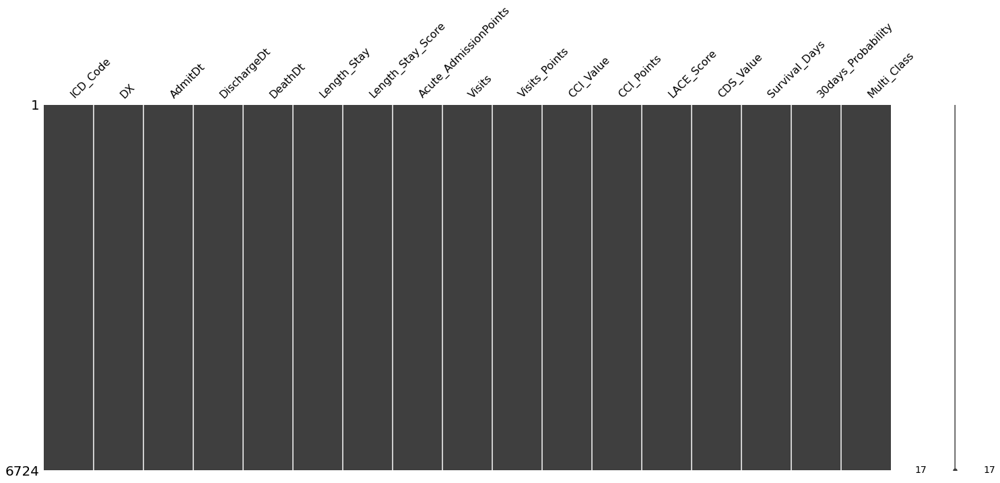

In [44]:
# Visualising missing values
msno.matrix(mortality)

/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:305: UserWarning: Attempting to set identical bottom == top == 0 results in singular transformations; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))
/usr/local/lib/python3.7/dist-packages/seaborn/matrix.py:305: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))


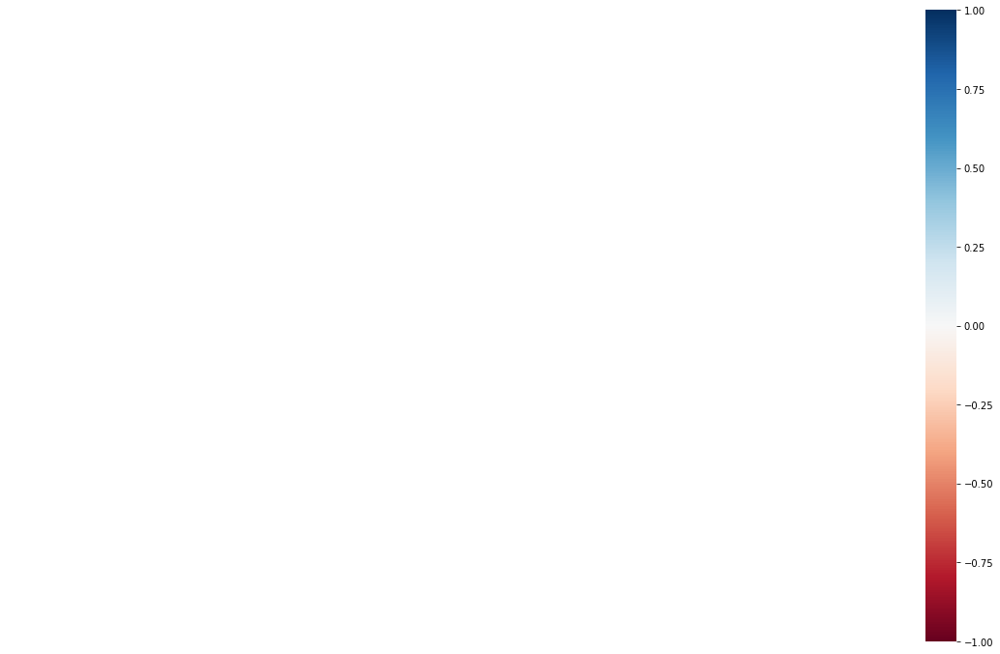

In [45]:
# Heatmap missing value
msno.heatmap(mortality)

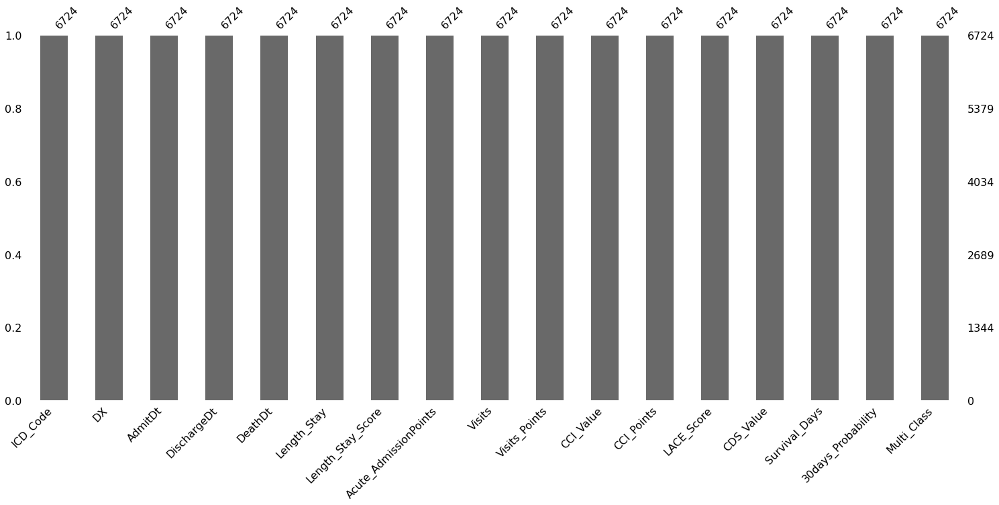

In [46]:
msno.bar(mortality)

In [47]:
mortality.skew(), mortality.kurt()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


(Length_Stay              2.838791
 Length_Stay_Score       -1.095682
 Acute_AdmissionPoints    1.280682
 Visits                   3.350316
 Visits_Points            3.169560
 CCI_Value                1.993113
 CCI_Points              -0.249307
 LACE_Score              -0.433282
 CDS_Value                2.160900
 Survival_Days            3.184518
 30days_Probability       0.399113
 dtype: float64, Length_Stay               9.672815
 Length_Stay_Score         0.024661
 Acute_AdmissionPoints     3.377759
 Visits                   13.473702
 Visits_Points            11.074067
 CCI_Value                 6.717767
 CCI_Points               -1.518051
 LACE_Score               -0.215251
 CDS_Value                 6.878986
 Survival_Days            13.071054
 30days_Probability       -0.384311
 dtype: float64)

In [48]:
### Correlation Heat Map

### CountPlot

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


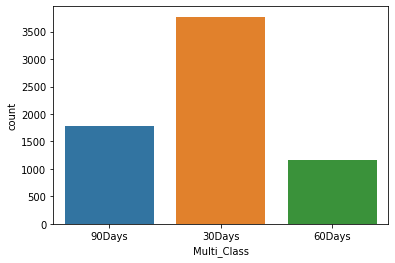

In [49]:
sns.countplot(mortality['Multi_Class'])
plt.show()

### Pie Chart

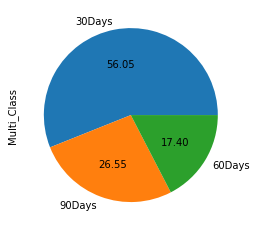

In [50]:
mortality['Multi_Class'].value_counts().plot(kind="pie", autopct="%.2f")
plt.show()

In [51]:
mortality.describe()

,Length_Stay,Length_Stay_Score,Acute_AdmissionPoints,Visits,Visits_Points,CCI_Value,CCI_Points,LACE_Score,CDS_Value,Survival_Days,30days_Probability
count,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000,6724.000000
mean,80.118977,5.497174,0.874777,1.159726,1.158834,4.183373,3.270821,10.801606,6.143218,91.891136,0.152086
std,135.727300,2.022370,0.673168,0.453137,0.446509,3.583452,1.730884,2.915676,7.026978,164.265316,0.065161
min,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.030000
25%,6.000000,4.000000,1.000000,1.000000,1.000000,2.000000,2.000000,9.000000,1.000000,6.000000,0.103000
50%,20.000000,7.000000,1.000000,1.000000,1.000000,3.000000,3.000000,11.000000,4.000000,21.000000,0.144000
75%,90.000000,7.000000,1.000000,1.000000,1.000000,6.000000,5.000000,13.000000,9.000000,99.000000,0.198000
max,1257.000000,7.000000,3.000000,5.000000,4.000000,42.000000,5.000000,19.000000,66.000000,1526.000000,0.437000


### Historgam


A histogram is a value distribution plot of numerical columns. It basically creates bins in various ranges in values and plots it where we can visualize how values are distributed. We can have a look where more values lie like in positive, negative, or at the center(mean). Let’s have a look at the Following  columns.

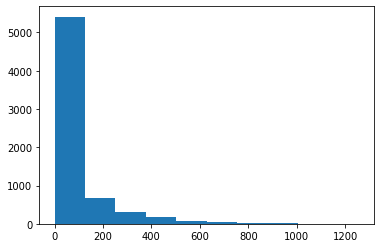

In [52]:
plt.hist(mortality["Length_Stay"], bins=10)
plt.show()

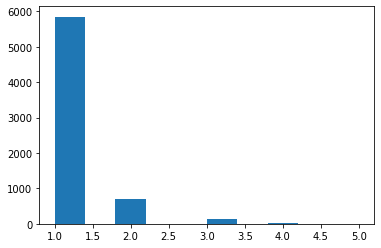

In [53]:
plt.hist(mortality["Visits"], bins=10)
plt.show()

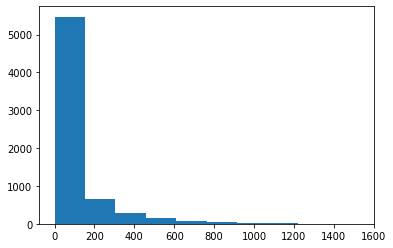

In [54]:

plt.hist(mortality["Survival_Days"], bins=10)
plt.show()


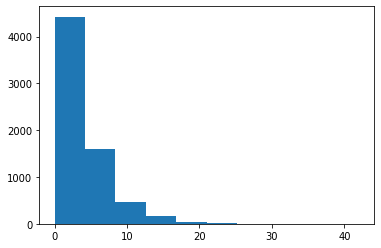

In [55]:
plt.hist(mortality["CCI_Value"], bins=10)
plt.show()

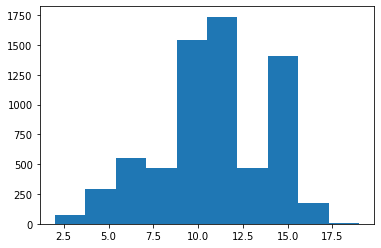

In [56]:
plt.hist(mortality["LACE_Score"], bins=10)
plt.show()

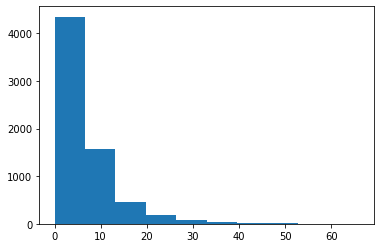

In [57]:
plt.hist(mortality["CDS_Value"], bins=10)
plt.show()

###  Distplot

Distplot is also known as the second Histogram because it is a slight improvement version of the Histogram. Distplot gives us a KDE(Kernel Density Estimation) over histogram which explains PDF(Probability Density Function) which means what is the probability of each value occurring in this column. If you have study statistics before then definitely you should know about PDF function

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


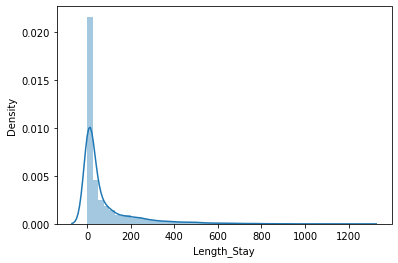

In [58]:
sns.distplot(mortality['Length_Stay']) 
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


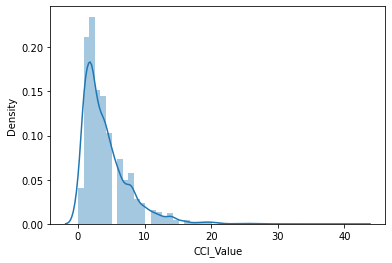

In [59]:
sns.distplot(mortality['CCI_Value']) 
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


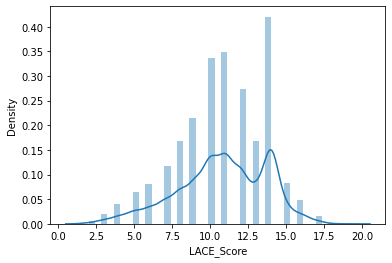

In [60]:
sns.distplot(mortality['LACE_Score']) 
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


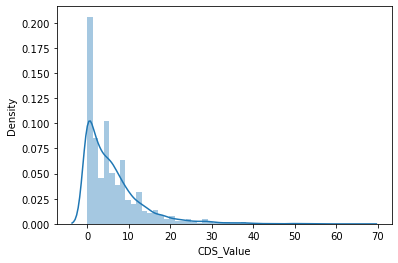

In [61]:
sns.distplot(mortality['CDS_Value']) 
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


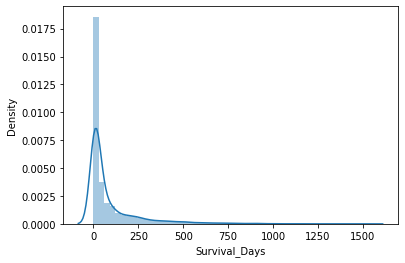

In [62]:
sns.distplot(mortality['Survival_Days']) 
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


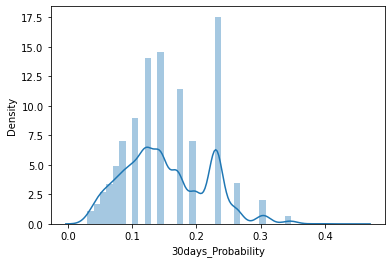

In [63]:
sns.distplot(mortality['30days_Probability']) 
plt.show()

### Scatter Plot

To plot the relationship between two numerical variables scatter plot is a simple plot to do. Let us see the relationship between the total bill and tip provided using a scatter plot.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


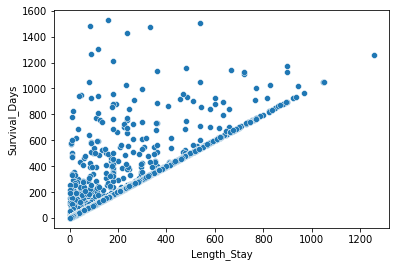

In [64]:
sns.scatterplot(numeric_features["Length_Stay"], numeric_features["Survival_Days"])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


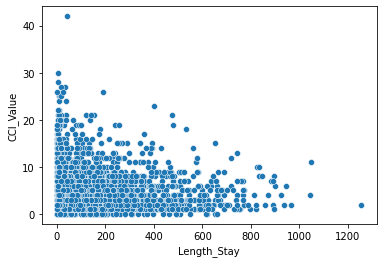

In [65]:
sns.scatterplot(numeric_features["Length_Stay"], numeric_features["CCI_Value"])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


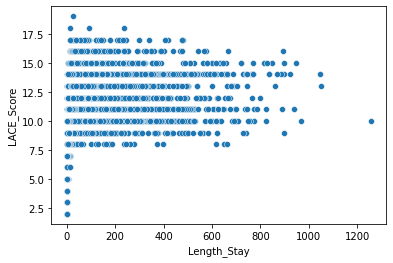

In [66]:
sns.scatterplot(numeric_features["Length_Stay"], numeric_features["LACE_Score"])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


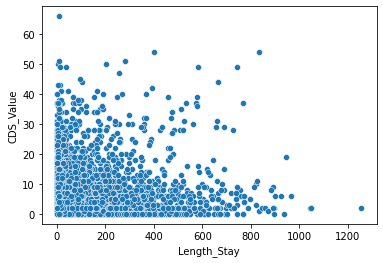

In [67]:
sns.scatterplot(numeric_features["Length_Stay"], numeric_features["CDS_Value"])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


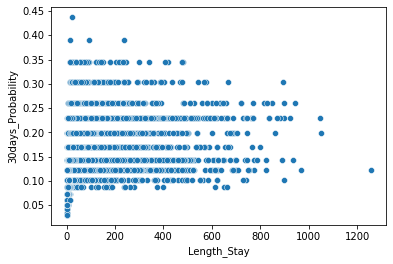

In [68]:
sns.scatterplot(numeric_features["Length_Stay"], numeric_features["30days_Probability"])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


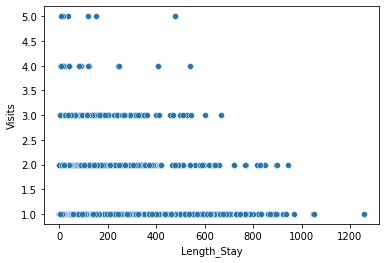

In [69]:

sns.scatterplot(numeric_features["Length_Stay"], numeric_features["Visits"])

### Multivariate analysis with scatter plot

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


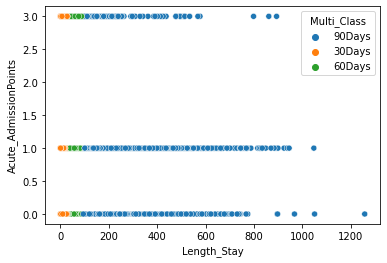

In [70]:
sns.scatterplot(mortality["Length_Stay"], mortality["Acute_AdmissionPoints"], hue=mortality["Multi_Class"])
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


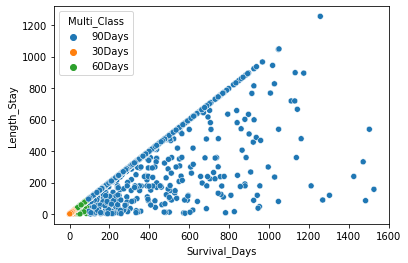

In [71]:
sns.scatterplot(mortality["Survival_Days"], mortality["Length_Stay"], hue=mortality["Multi_Class"])
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


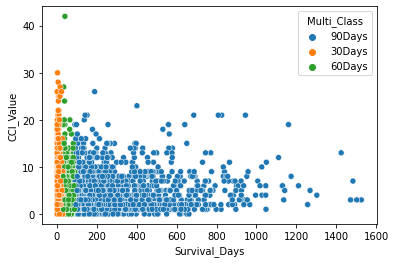

In [72]:
sns.scatterplot(mortality["Survival_Days"], mortality["CCI_Value"], hue=mortality["Multi_Class"])
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


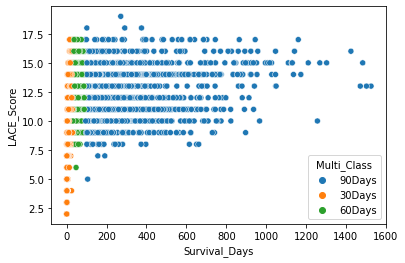

In [73]:
sns.scatterplot(mortality["Survival_Days"], mortality["LACE_Score"], hue=mortality["Multi_Class"])
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


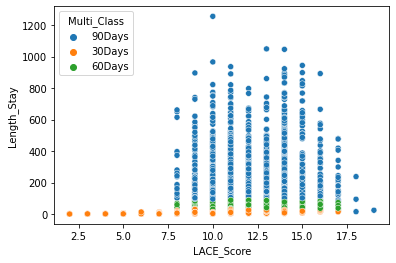

In [74]:
sns.scatterplot(mortality["LACE_Score"], mortality["Length_Stay"], hue=mortality["Multi_Class"])
plt.show()

### Numerical and Categorical


If one variable is numerical and one is categorical then there are various plots that we can use for Bivariate and Multivariate analysis.

#### Bar Plot

Bar plot is a simple plot which we can use to plot categorical variable on the x-axis and numerical variable on y-axis and explore the relationship between both variables. The blacktip on top of each bar shows the confidence Interval. let us explore CCI_Points with Multi_Class.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


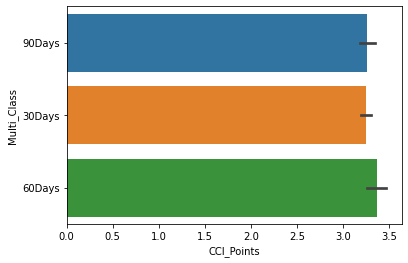

In [75]:
sns.barplot(mortality['CCI_Points'], mortality['Multi_Class'])
plt.show()

### Multivariate analysis using Bar plot

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


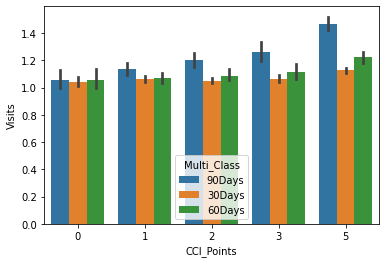

In [76]:
sns.barplot(mortality['CCI_Points'], mortality['Visits'], hue = mortality['Multi_Class'] )
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


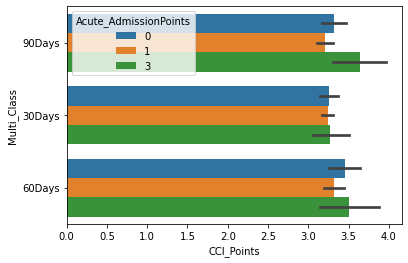

In [77]:
sns.barplot(mortality['CCI_Points'], mortality['Multi_Class'], hue = mortality['Acute_AdmissionPoints'] )
plt.show()

In [78]:
mortality.sample(5)

,ICD_Code,DX,AdmitDt,DischargeDt,DeathDt,Length_Stay,Length_Stay_Score,Acute_AdmissionPoints,Visits,Visits_Points,CCI_Value,CCI_Points,LACE_Score,CDS_Value,Survival_Days,30days_Probability,Multi_Class
923,I10,ESSENTIAL (PRIMARY) HYPERTENSION,10-03-2015,15-12-2015,15-12-2015,73,7,0,1,1,2,2,10,0,73,0.122,60Days
2082,J44.9,"CHRONIC OBSTRUCTIVE PULMONARY DISEASE, UNSPECI...",19-04-2016,20-01-2017,20-01-2017,276,7,1,1,1,2,2,11,0,276,0.144,90Days
397,C80.1,"MALIGNANT (PRIMARY) NEOPLASM, UNSPECIFIED",16-11-2017,18-11-2017,18-11-2017,2,2,1,2,2,4,5,10,6,2,0.122,30Days
6405,I15.0,RENOVASCULAR HYPERTENSION,19-04-2019,21-04-2019,21-04-2019,2,2,1,1,1,4,5,9,0,2,0.103,30Days
6413,Z85.21,PERSONAL HISTORY OF MALIGNANT NEOPLASM OF LARYNX,21-05-2019,07-07-2019,07-07-2019,47,7,1,2,2,2,2,12,10,47,0.170,60Days


### Heat Maps

Heat Maps is a type of plot which is necessary when we need to find the dependent variables. One of the best way to find the relationship between the features can be done using heat maps. 

,Length_Stay,Length_Stay_Score,Acute_AdmissionPoints,Visits,Visits_Points,CCI_Value,CCI_Points,LACE_Score,CDS_Value,Survival_Days,30days_Probability
Length_Stay,1.000000,0.417368,-0.011337,0.109214,0.110037,-0.003902,-0.003887,0.301421,0.047655,0.886865,0.290924
Length_Stay_Score,0.417368,1.000000,-0.017632,0.105832,0.106247,0.044846,0.055267,0.738629,0.042434,0.388563,0.666551
Acute_AdmissionPoints,-0.011337,-0.017632,1.000000,-0.033407,-0.033285,0.008349,0.006387,0.217343,0.011842,-0.017867,0.252845
Visits,0.109214,0.105832,-0.033407,1.000000,0.997905,0.220858,0.153069,0.309383,0.187001,0.301038,0.363289
Visits_Points,0.110037,0.106247,-0.033285,0.997905,1.000000,0.214478,0.153344,0.310184,0.180337,0.299681,0.363603
CCI_Value,-0.003902,0.044846,0.008349,0.220858,0.214478,1.000000,0.737466,0.503674,0.385251,0.044287,0.526106
CCI_Points,-0.003887,0.055267,0.006387,0.153069,0.153344,0.737466,1.000000,0.656940,0.354627,0.035867,0.668433
LACE_Score,0.301421,0.738629,0.217343,0.309383,0.310184,0.503674,0.656940,1.000000,0.270307,0.332575,0.973205
CDS_Value,0.047655,0.042434,0.011842,0.187001,0.180337,0.385251,0.354627,0.270307,1.000000,0.077984,0.293007
Survival_Days,0.886865,0.388563,-0.017867,0.301038,0.299681,0.044287,0.035867,0.332575,0.077984,1.000000,0.339340


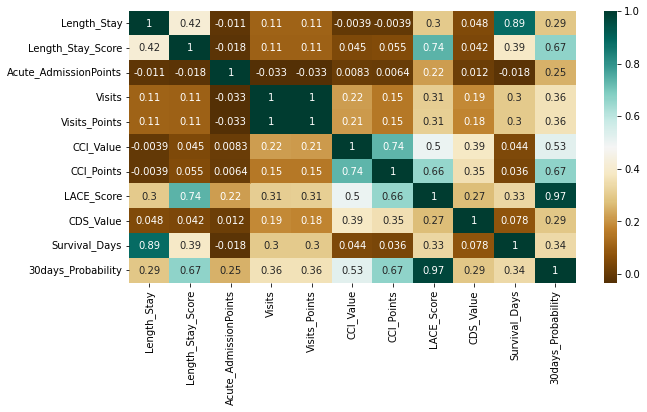

In [79]:
plt.figure(figsize=(10,5))
c= mortality.corr()
sns.heatmap(c,cmap="BrBG",annot=True)
c

,Length_Stay,Length_Stay_Score,Acute_AdmissionPoints,Visits,Visits_Points,CCI_Value,CCI_Points,LACE_Score,CDS_Value,Survival_Days,30days_Probability
Length_Stay,1.000000,0.417368,-0.011337,0.109214,0.110037,-0.003902,-0.003887,0.301421,0.047655,0.886865,0.290924
Length_Stay_Score,0.417368,1.000000,-0.017632,0.105832,0.106247,0.044846,0.055267,0.738629,0.042434,0.388563,0.666551
Acute_AdmissionPoints,-0.011337,-0.017632,1.000000,-0.033407,-0.033285,0.008349,0.006387,0.217343,0.011842,-0.017867,0.252845
Visits,0.109214,0.105832,-0.033407,1.000000,0.997905,0.220858,0.153069,0.309383,0.187001,0.301038,0.363289
Visits_Points,0.110037,0.106247,-0.033285,0.997905,1.000000,0.214478,0.153344,0.310184,0.180337,0.299681,0.363603
CCI_Value,-0.003902,0.044846,0.008349,0.220858,0.214478,1.000000,0.737466,0.503674,0.385251,0.044287,0.526106
CCI_Points,-0.003887,0.055267,0.006387,0.153069,0.153344,0.737466,1.000000,0.656940,0.354627,0.035867,0.668433
LACE_Score,0.301421,0.738629,0.217343,0.309383,0.310184,0.503674,0.656940,1.000000,0.270307,0.332575,0.973205
CDS_Value,0.047655,0.042434,0.011842,0.187001,0.180337,0.385251,0.354627,0.270307,1.000000,0.077984,0.293007
Survival_Days,0.886865,0.388563,-0.017867,0.301038,0.299681,0.044287,0.035867,0.332575,0.077984,1.000000,0.339340


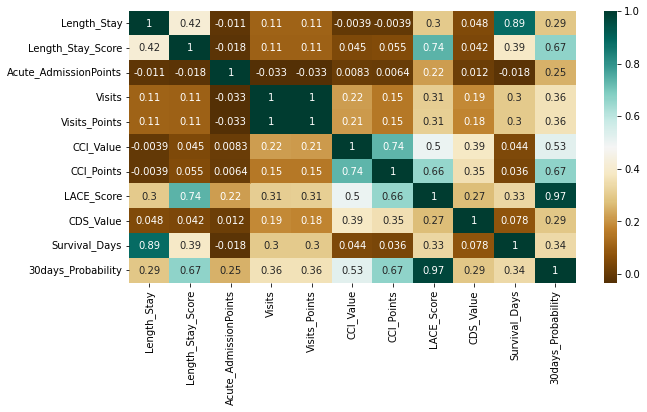

In [80]:
plt.figure(figsize=(10,5))
c= numeric_features.corr()
sns.heatmap(c,cmap="BrBG",annot=True)
c

In [81]:
mortality=mortality.drop(["Visits"], axis = 1)

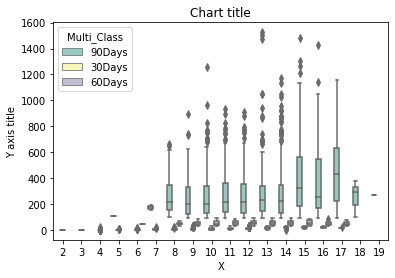

In [82]:
ax = sns.boxplot(x="LACE_Score", y="Survival_Days", hue="Multi_Class", data=mortality, palette="Set3")
#Adding the aesthetics
plt.title('Chart title')
plt.xlabel('X')
plt.ylabel('Y axis title') 
# Show the plot
plt.show()

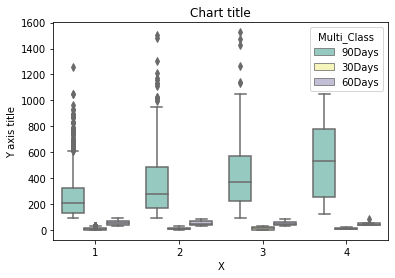

In [83]:
ax = sns.boxplot(x="Visits_Points", y="Survival_Days", hue="Multi_Class", data=mortality, palette="Set3")
#Adding the aesthetics
plt.title('Chart title')
plt.xlabel('X')
plt.ylabel('Y axis title') 
# Show the plot
plt.show()

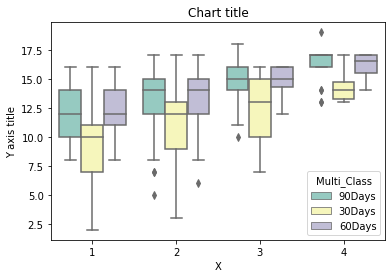

In [84]:
ax = sns.boxplot(x="Visits_Points", y="LACE_Score", hue="Multi_Class", data=mortality, palette="Set3")
#Adding the aesthetics
plt.title('Chart title')
plt.xlabel('X')
plt.ylabel('Y axis title') 
# Show the plot
plt.show()

### Pairwise Relationships 

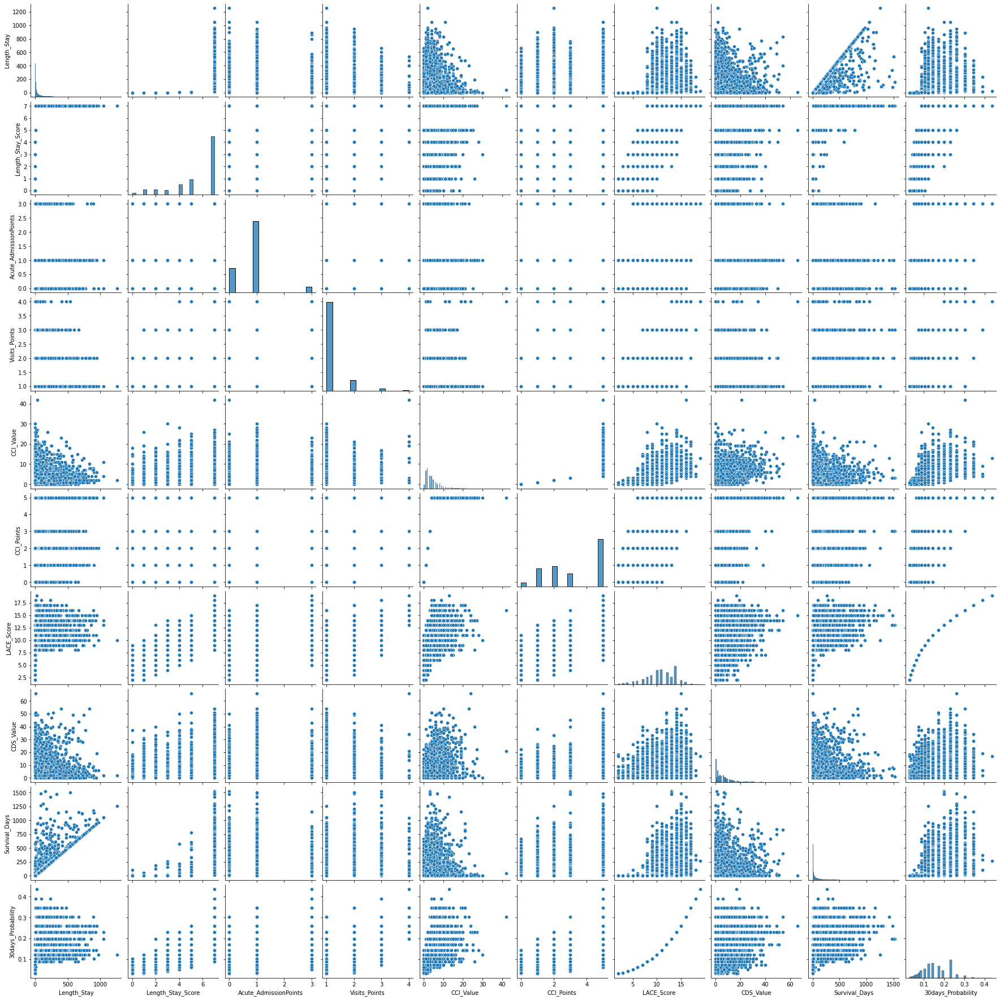

In [85]:
sns.pairplot(mortality)

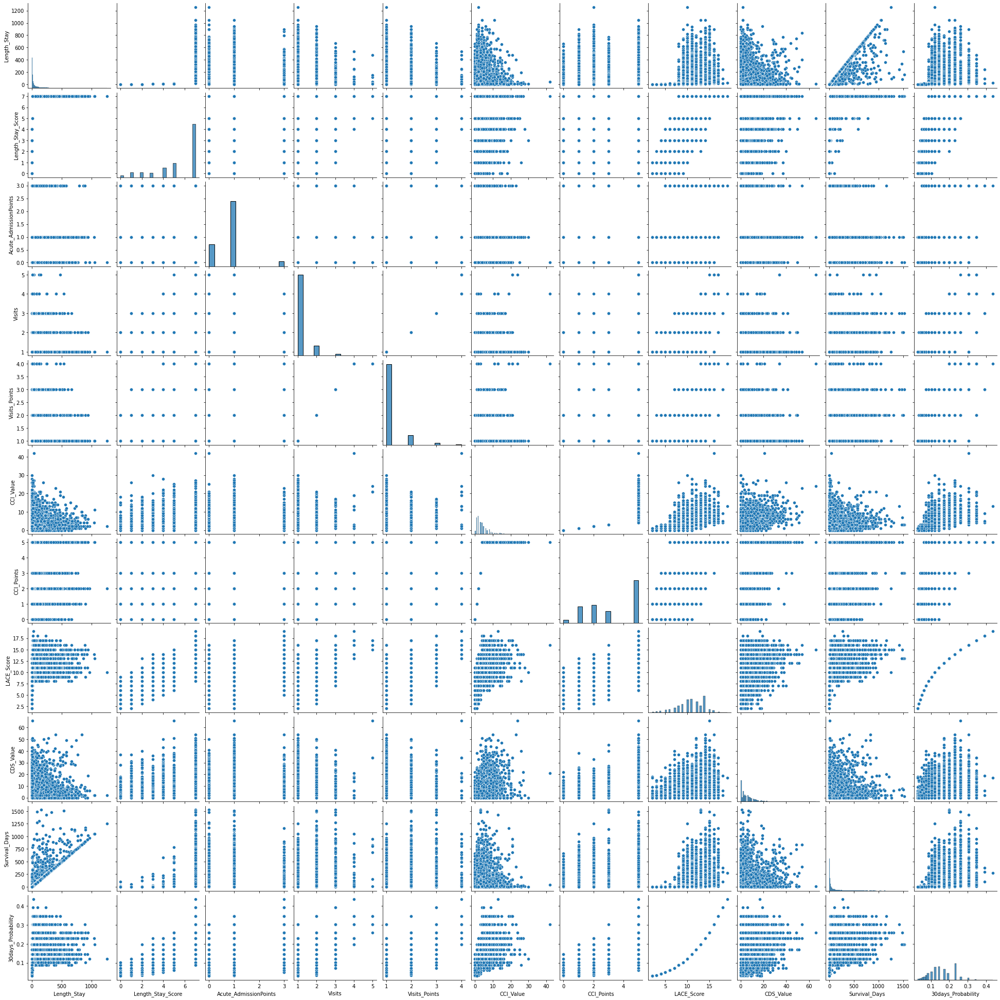

In [86]:
sns.pairplot(numeric_features)

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


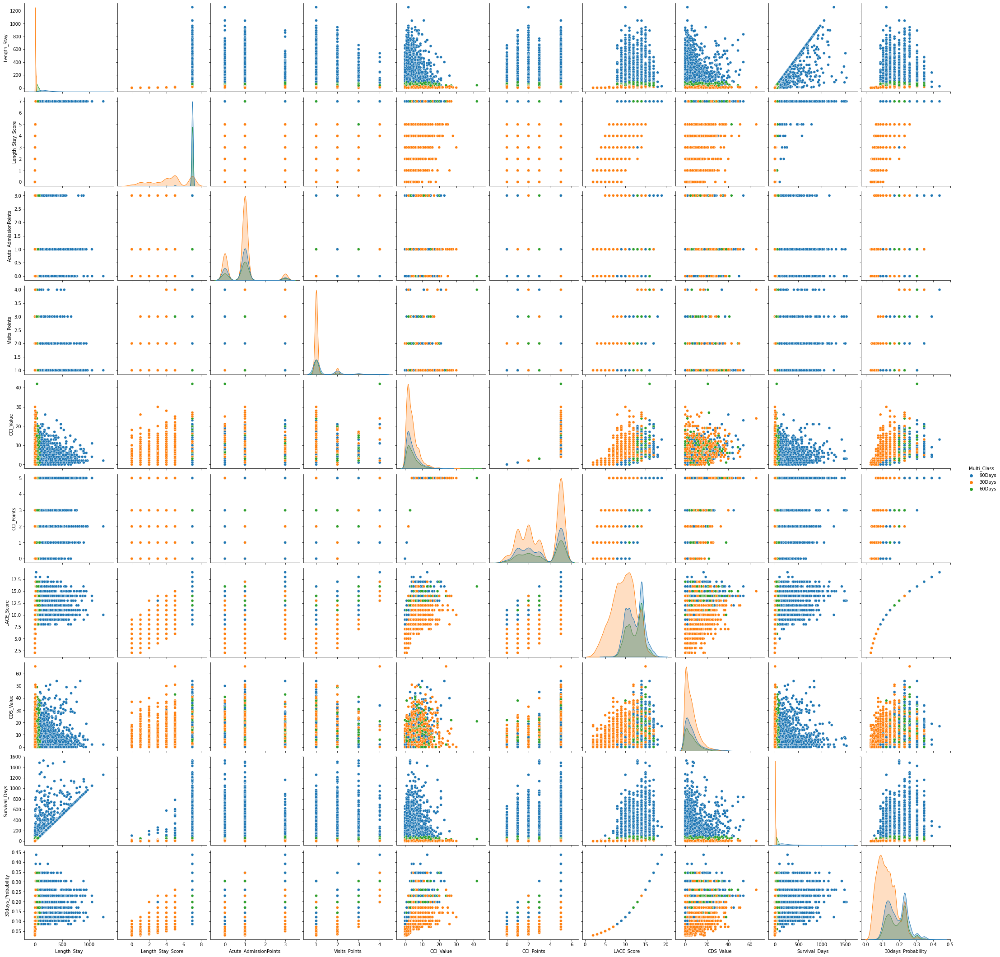

In [87]:
# PairPlot 

sns.pairplot(mortality, hue = "Multi_Class", size=3)
plt.show()

In [88]:
mortality.columns

Index(['ICD_Code', 'DX', 'AdmitDt', 'DischargeDt', 'DeathDt', 'Length_Stay',
       'Length_Stay_Score', 'Acute_AdmissionPoints', 'Visits_Points',
       'CCI_Value', 'CCI_Points', 'LACE_Score', 'CDS_Value', 'Survival_Days',
       '30days_Probability', 'Multi_Class'],
      dtype='object')

In [89]:
mortality.to_csv('model_mortality.csv')

                               #### Model Building ###

# ** Model Building**

In [90]:
#load all necessary libraries
import warnings
warnings.filterwarnings('ignore')
import pandas as pd 
import numpy as np 
import scipy as scp
import sklearn
import matplotlib.pyplot as plt 
import seaborn as sns
import missingno
import missingno as msno
%matplotlib inline
sns.set_style('darkgrid')

from sklearn import preprocessing
from sklearn import utils

In [91]:
# reading the multiple csv files
df30 = pd.read_csv("/content/drive/MyDrive/EDA/FinalCode/mortality_30days.csv")
df60 = pd.read_csv("/content/drive/MyDrive/EDA/FinalCode/mortality_60days.csv")
df90 = pd.read_csv("/content/drive/MyDrive/EDA/FinalCode/mortality_90days.csv")

In [92]:
df30.columns

Index(['Patkey', 'ICD_Code', 'DX', 'AdmitDt', 'DischargeDt', 'DeathDt',
       'Length_Stay', 'Length_Stay_Score', 'Acute_Admission',
       'Acute_AdmissionPoints', 'Visits', 'Visits_Points', 'CCI_Value',
       'CCI_Points', 'LACE_Score', 'CDS_Value', 'Survival_Days',
       '30days_Probability', 'Class_30days'],
      dtype='object')

In [93]:
df30=df30.drop(["Patkey","ICD_Code", "DX", "AdmitDt", "DischargeDt", "Acute_Admission", "DeathDt","Length_Stay" ], axis = 1)

In [94]:
df60=df60.drop(["Patkey","ICD_Code", "DX", "AdmitDt", "DischargeDt", "Acute_Admission", "DeathDt","Length_Stay" ], axis = 1)

In [95]:
df90=df90.drop(["Patkey","ICD_Code", "DX", "AdmitDt", "DischargeDt", "Acute_Admission", "DeathDt","Length_Stay" ], axis = 1)

In [96]:
# encode categorical variables using Label Encoder

# select all categorical variables
df30_categorical = df30.select_dtypes(include=['object'])
df60_categorical = df60.select_dtypes(include=['object'])
df90_categorical = df90.select_dtypes(include=['object'])

df30_categorical.head()

,Class_30days
0,No
1,No
2,No
3,No
4,Yes


In [97]:
df60_categorical.head()

,Class_60days
0,No
1,No
2,No
3,No
4,Yes


In [98]:
df90_categorical.head()

,Class_90days
0,No
1,No
2,No
3,No
4,Yes


In [99]:
# apply Label encoder to df_categorical

le = preprocessing.LabelEncoder()
df30_categorical = df30_categorical.apply(le.fit_transform)
df60_categorical = df60_categorical.apply(le.fit_transform)
df90_categorical = df90_categorical.apply(le.fit_transform)
df30_categorical.head()

,Class_30days
0,0
1,0
2,0
3,0
4,1


In [100]:
# concat df_categorical with original df
df30 = df30.drop(df30_categorical.columns, axis=1)
df30 = pd.concat([df30, df30_categorical], axis=1)
df60 = df60.drop(df60_categorical.columns, axis=1)
df60 = pd.concat([df60, df60_categorical], axis=1)
df90 = df90.drop(df90_categorical.columns, axis=1)
df90 = pd.concat([df90, df90_categorical], axis=1)
df60.head()

,Length_Stay_Score,Acute_AdmissionPoints,Visits,Visits_Points,CCI_Value,CCI_Points,LACE_Score,CDS_Value,Survival_Days,30days_Probability,Class_60days
0,7,1,2,2,4,5,15,4,996,0.260,0
1,7,1,2,2,4,5,15,4,125,0.260,0
2,5,0,3,3,4,5,13,8,226,0.198,0
3,7,0,3,3,4,5,15,8,195,0.260,0
4,7,1,3,3,4,5,16,8,21,0.304,1


In [101]:
print(df30.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Length_Stay_Score      6724 non-null   int64  
 1   Acute_AdmissionPoints  6724 non-null   int64  
 2   Visits                 6724 non-null   int64  
 3   Visits_Points          6724 non-null   int64  
 4   CCI_Value              6724 non-null   int64  
 5   CCI_Points             6724 non-null   int64  
 6   LACE_Score             6724 non-null   int64  
 7   CDS_Value              6724 non-null   int64  
 8   Survival_Days          6724 non-null   int64  
 9   30days_Probability     6724 non-null   float64
 10  Class_30days           6724 non-null   int64  
dtypes: float64(1), int64(10)
memory usage: 578.0 KB
None


In [102]:
print(df60.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Length_Stay_Score      6724 non-null   int64  
 1   Acute_AdmissionPoints  6724 non-null   int64  
 2   Visits                 6724 non-null   int64  
 3   Visits_Points          6724 non-null   int64  
 4   CCI_Value              6724 non-null   int64  
 5   CCI_Points             6724 non-null   int64  
 6   LACE_Score             6724 non-null   int64  
 7   CDS_Value              6724 non-null   int64  
 8   Survival_Days          6724 non-null   int64  
 9   30days_Probability     6724 non-null   float64
 10  Class_60days           6724 non-null   int64  
dtypes: float64(1), int64(10)
memory usage: 578.0 KB
None


In [103]:
print(df90.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Length_Stay_Score      6724 non-null   int64  
 1   Acute_AdmissionPoints  6724 non-null   int64  
 2   Visits                 6724 non-null   int64  
 3   Visits_Points          6724 non-null   int64  
 4   CCI_Value              6724 non-null   int64  
 5   CCI_Points             6724 non-null   int64  
 6   LACE_Score             6724 non-null   int64  
 7   CDS_Value              6724 non-null   int64  
 8   Survival_Days          6724 non-null   int64  
 9   30days_Probability     6724 non-null   float64
 10  Class_90days           6724 non-null   int64  
dtypes: float64(1), int64(10)
memory usage: 578.0 KB
None


In [104]:
# convert target variable CLass_30 days to categorical
df30['Class_30days'] = df30['Class_30days'].astype('category')
# convert target variable income to categorical
df60['Class_60days'] = df60['Class_60days'].astype('category')
# convert target variable income to categorical
df90['Class_90days'] = df90['Class_90days'].astype('category')

In [105]:
# look at column types
print(df30.info())
print(df60.info())
print(df90.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Length_Stay_Score      6724 non-null   int64   
 1   Acute_AdmissionPoints  6724 non-null   int64   
 2   Visits                 6724 non-null   int64   
 3   Visits_Points          6724 non-null   int64   
 4   CCI_Value              6724 non-null   int64   
 5   CCI_Points             6724 non-null   int64   
 6   LACE_Score             6724 non-null   int64   
 7   CDS_Value              6724 non-null   int64   
 8   Survival_Days          6724 non-null   int64   
 9   30days_Probability     6724 non-null   float64 
 10  Class_30days           6724 non-null   category
dtypes: category(1), float64(1), int64(9)
memory usage: 532.1 KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6724 entries, 0 to 6723
Data columns (total 11 columns):
 #   Column                

### Feature Importance

In [106]:
# Putting feature variable to X
X30 = df30.drop(['Class_30days'],axis=1)
X60 = df60.drop(['Class_60days'],axis=1)
X90 = df90.drop(['Class_90days'],axis=1)
# Putting response variable to y
y30 = df30['Class_30days']
y60 = df60['Class_60days']
y90 = df90['Class_90days']

In [107]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [108]:
# Splitting the data into train and test
X_train30, X_test30, y_train30, y_test30 = train_test_split(X30, y30, 
                                                    test_size=0.30, 
                                                    random_state = 99)

X_train60, X_test60, y_train60, y_test60 = train_test_split(X60, y60, 
                                                    test_size=0.30, 
                                                    random_state = 99)

X_train90, X_test90, y_train90, y_test90 = train_test_split(X90, y90, 
                                                    test_size=0.30, 
                                                    random_state = 99)


In [109]:
# Putting feature variable to X
X30 = df30[['CCI_Value', 'LACE_Score', 'CDS_Value', 'Length_Stay_Score',
       '30days_Probability']]
X60 = df60[['CCI_Value', 'LACE_Score', 'CDS_Value', 'Length_Stay_Score',
       '30days_Probability']]
X90 = df90[['CCI_Value', 'LACE_Score', 'CDS_Value', 'Length_Stay_Score',
       '30days_Probability']]
# Putting response variable to y
y30 = df30['Class_30days']
y60 = df60['Class_60days']
y90 = df90['Class_90days']

# Machine Learning Model

In [110]:
# Splitting the data into train and test
X_train30, X_test30, y_train30, y_test30 = train_test_split(X30, y30, 
                                                    test_size=0.30, 
                                                    random_state = 99)

X_train60, X_test60, y_train60, y_test60 = train_test_split(X60, y60, 
                                                    test_size=0.30, 
                                                    random_state = 99)

X_train90, X_test90, y_train90, y_test90 = train_test_split(X90, y90, 
                                                    test_size=0.30, 
                                                    random_state = 99)

### Logistic Regression

In [111]:
from sklearn.linear_model import LogisticRegression
classifier30 = LogisticRegression(random_state = 0)
classifier30.fit(X_train30, y_train30)
classifier60 = LogisticRegression(random_state = 0)
classifier60.fit(X_train60, y_train60)
classifier90 = LogisticRegression(random_state = 0)
classifier90.fit(X_train90, y_train90)

# Predicting the Test set results
y_pred30 = classifier30.predict(X_test30)
y_pred60 = classifier60.predict(X_test60)
y_pred90 = classifier90.predict(X_test90)

In [112]:
# Making the Confusion Matrix and Accuracy Score 
from sklearn.metrics import confusion_matrix, accuracy_score
cm30 = confusion_matrix(y_test30, y_pred30)
acc30 = accuracy_score(y_test30, y_pred30)
cm60 = confusion_matrix(y_test60, y_pred60)
acc60 = accuracy_score(y_test60, y_pred60)
cm90 = confusion_matrix(y_test90, y_pred90)
acc90 = accuracy_score(y_test90, y_pred90)

In [113]:
# Applying k-Fold Cross Validation
from sklearn.model_selection import cross_val_score
accuracy30 = cross_val_score(estimator = classifier30, X= X_train30, y = y_train30, cv=5)
accuracy30.mean()
print(accuracy30.mean())
accuracy60 = cross_val_score(estimator = classifier60, X= X_train60, y = y_train60, cv=5)
accuracy60.mean()
print(accuracy60.mean())
accuracy90 = cross_val_score(estimator = classifier90, X= X_train90, y = y_train90, cv=5)
accuracy90.mean()
print(accuracy90.mean())

0.8531685811047109
0.7422480488977033
0.7365087960361996


AUC for 30 days Mortality: 0.86
AUC for 60 days Mortality: 0.81
AUC for 90 days Mortality: 0.78


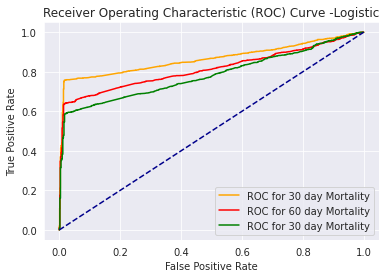

In [114]:
# Compute ROC curve and ROC area 
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.datasets import make_classification

def plot_roc_curve(fpr30, tpr30,fpr60, tpr60,fpr90, tpr90):
    plt.plot(fpr30, tpr30, color='orange', label='ROC for 30 day Mortality')
    plt.plot(fpr60, tpr60, color='red', label='ROC for 60 day Mortality')
    plt.plot(fpr90, tpr90, color='green', label='ROC for 30 day Mortality')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve -Logistic')
    plt.legend()
    plt.show()


#Plot of a ROC curve
data_X, class_label = make_classification(n_samples=1000, n_classes=2, weights=[1,1], random_state=1)

probs30 = classifier30.predict_proba(X_test30)
probs30 =probs30[:, 1]
auc30 = roc_auc_score(y_test30, probs30)
print('AUC for 30 days Mortality: %.2f' % auc30)
fpr30, tpr30, thresholds30 = roc_curve(y_test30, probs30)
probs60 = classifier60.predict_proba(X_test60)
probs60 =probs60[:, 1]
auc60 = roc_auc_score(y_test60, probs60)
print('AUC for 60 days Mortality: %.2f' % auc60)
fpr60, tpr60, thresholds60 = roc_curve(y_test60, probs60)
probs90 = classifier90.predict_proba(X_test90)
probs90 =probs90[:, 1]
auc90 = roc_auc_score(y_test90, probs90)
print('AUC for 90 days Mortality: %.2f' % auc90)
fpr90, tpr90, thresholds90 = roc_curve(y_test90, probs90)
plot_roc_curve(fpr30, tpr30,fpr60, tpr60,fpr90, tpr90)

### KNN

In [115]:
# Fitting K-NN to the Training set
from sklearn.neighbors import KNeighborsClassifier
classifier30 = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
classifier30.fit(X_train30, y_train30)
classifier60 = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
classifier60.fit(X_train60, y_train60)
classifier90 = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
classifier90.fit(X_train90, y_train90)

KNeighborsClassifier()

In [116]:
# Predicting the Test set results
y_pred_KNN30 = classifier30.predict(X_test30)
y_pred_KNN60 = classifier60.predict(X_test60)
y_pred_KNN90 = classifier90.predict(X_test90)

In [117]:
# Making the Confusion Matrix and Accuracy Score 
from sklearn.metrics import confusion_matrix, accuracy_score
KNNcm30 = confusion_matrix(y_test30, y_pred_KNN30)
KNNacc30 = accuracy_score(y_test30, y_pred_KNN30)
KNNcm60 = confusion_matrix(y_test60, y_pred_KNN60)
KNNacc60 = accuracy_score(y_test60, y_pred_KNN60)
KNNcm90 = confusion_matrix(y_test90, y_pred_KNN90)
KNNacc90 = accuracy_score(y_test90, y_pred_KNN90)

In [118]:
# Applying k-Fold Cross Validation
from sklearn.model_selection import cross_val_score
accuracy30 = cross_val_score(estimator = classifier30, X= X_train30, y = y_train30, cv=5)
accuracy30.mean()
print(accuracy30.mean())
accuracy60 = cross_val_score(estimator = classifier60, X= X_train60, y = y_train60, cv=5)
accuracy60.mean()
print(accuracy60.mean())
accuracy90 = cross_val_score(estimator = classifier90, X= X_train90, y = y_train90, cv=5)
accuracy90.mean()
print(accuracy90.mean())

0.8227830536696967
0.739484579579478
0.7401185891144398


AUC for 30 days Mortality: 0.87
AUC for 60 days Mortality: 0.81
AUC for 90 days Mortality: 0.78


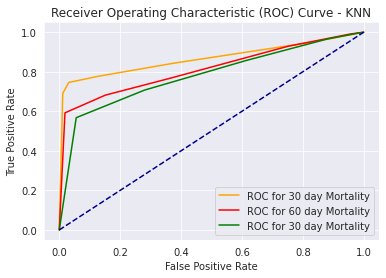

In [119]:
# Compute ROC curve and ROC area 
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.datasets import make_classification

def plot_roc_curve(fpr30, tpr30,fpr60, tpr60,fpr90, tpr90):
    plt.plot(fpr30, tpr30, color='orange', label='ROC for 30 day Mortality')
    plt.plot(fpr60, tpr60, color='red', label='ROC for 60 day Mortality')
    plt.plot(fpr90, tpr90, color='green', label='ROC for 30 day Mortality')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve - KNN')
    plt.legend()
    plt.show()


#Plot of a ROC curve
data_X, class_label = make_classification(n_samples=1000, n_classes=2, weights=[1,1], random_state=1)

probs30 = classifier30.predict_proba(X_test30)
probs30 =probs30[:, 1]
auc30 = roc_auc_score(y_test30, probs30)
print('AUC for 30 days Mortality: %.2f' % auc30)
fpr30, tpr30, thresholds30 = roc_curve(y_test30, probs30)
probs60 = classifier60.predict_proba(X_test60)
probs60 =probs60[:, 1]
auc60 = roc_auc_score(y_test60, probs60)
print('AUC for 60 days Mortality: %.2f' % auc60)
fpr60, tpr60, thresholds60 = roc_curve(y_test60, probs60)
probs90 = classifier90.predict_proba(X_test90)
probs90 =probs90[:, 1]
auc90 = roc_auc_score(y_test90, probs90)
print('AUC for 90 days Mortality: %.2f' % auc90)
fpr90, tpr90, thresholds90 = roc_curve(y_test90, probs90)
plot_roc_curve(fpr30, tpr30,fpr60, tpr60,fpr90, tpr90)


In [120]:
### Random Forest

In [121]:
from sklearn.ensemble import RandomForestClassifier
classifier30 = RandomForestClassifier(n_estimators = 25, criterion ='entropy', random_state = 0)
classifier30.fit(X_train30, y_train30)
classifier60 = RandomForestClassifier(n_estimators = 25, criterion ='entropy', random_state = 0)
classifier60.fit(X_train60, y_train60)
classifier90 = RandomForestClassifier(n_estimators = 25, criterion ='entropy', random_state = 0)
classifier90.fit(X_train90, y_train90)


# Predicting the Test set results
y_pred_RF30 = classifier30.predict(X_test30)
y_pred_RF60 = classifier60.predict(X_test60)
y_pred_RF90 = classifier90.predict(X_test90)

In [122]:
# Making the Confusion Matrix and Accuracy Score 
from sklearn.metrics import confusion_matrix, accuracy_score
RFcm30 = confusion_matrix(y_test30, y_pred_RF30)
RFacc30 = accuracy_score(y_test30, y_pred_RF30)
RFcm60 = confusion_matrix(y_test60, y_pred_RF60)
RFacc60 = accuracy_score(y_test60, y_pred_RF60)
RFcm90 = confusion_matrix(y_test90, y_pred_RF90)
RFacc90 = accuracy_score(y_test90, y_pred_RF90)

In [123]:
# Applying k-Fold Cross Validation
from sklearn.model_selection import cross_val_score
accuracy30 = cross_val_score(estimator = classifier30, X= X_train30, y = y_train30, cv=5)
accuracy30.mean()
print(accuracy30.mean())
accuracy60 = cross_val_score(estimator = classifier60, X= X_train60, y = y_train60, cv=5)
accuracy60.mean()
print(accuracy60.mean())
accuracy90 = cross_val_score(estimator = classifier90, X= X_train90, y = y_train90, cv=5)
accuracy90.mean()
print(accuracy90.mean())

0.8280927143053759
0.741821841064414
0.7394823233177877


AUC for 30 days Mortality: 0.87
AUC for 60 days Mortality: 0.81
AUC for 90 days Mortality: 0.79


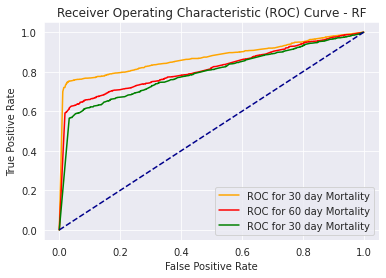

In [124]:
# Compute ROC curve and ROC area 
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.datasets import make_classification

def plot_roc_curve(fpr30, tpr30,fpr60, tpr60,fpr90, tpr90):
    plt.plot(fpr30, tpr30, color='orange', label='ROC for 30 day Mortality')
    plt.plot(fpr60, tpr60, color='red', label='ROC for 60 day Mortality')
    plt.plot(fpr90, tpr90, color='green', label='ROC for 30 day Mortality')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve - RF')
    plt.legend()
    plt.show()


#Plot of a ROC curve
data_X, class_label = make_classification(n_samples=1000, n_classes=2, weights=[1,1], random_state=1)

probs30 = classifier30.predict_proba(X_test30)
probs30 =probs30[:, 1]
auc30 = roc_auc_score(y_test30, probs30)
print('AUC for 30 days Mortality: %.2f' % auc30)
fpr30, tpr30, thresholds30 = roc_curve(y_test30, probs30)
probs60 = classifier60.predict_proba(X_test60)
probs60 =probs60[:, 1]
auc60 = roc_auc_score(y_test60, probs60)
print('AUC for 60 days Mortality: %.2f' % auc60)
fpr60, tpr60, thresholds60 = roc_curve(y_test60, probs60)
probs90 = classifier90.predict_proba(X_test90)
probs90 =probs90[:, 1]
auc90 = roc_auc_score(y_test90, probs90)
print('AUC for 90 days Mortality: %.2f' % auc90)
fpr90, tpr90, thresholds90 = roc_curve(y_test90, probs90)
plot_roc_curve(fpr30, tpr30,fpr60, tpr60,fpr90, tpr90)

In [125]:
### Decision Tree classification

In [126]:
from sklearn.tree import DecisionTreeClassifier

classifier30 = DecisionTreeClassifier(max_depth=12, random_state = 0)
classifier30.fit(X_train30, y_train30)
classifier60 = DecisionTreeClassifier(max_depth=12, random_state = 0)
classifier60.fit(X_train60, y_train60)
classifier90 = DecisionTreeClassifier(max_depth=12, random_state = 0)
classifier90.fit(X_train90, y_train90)


# Predicting the Test set results
y_pred_DT30 = classifier30.predict(X_test30)
y_pred_DT60 = classifier60.predict(X_test60)
y_pred_DT90 = classifier90.predict(X_test90)


In [127]:
# Making the Confusion Matrix and Accuracy Score 
from sklearn.metrics import confusion_matrix, accuracy_score
DTcm30 = confusion_matrix(y_test30, y_pred_DT30)
DTacc30 = accuracy_score(y_test30, y_pred_DT30)
DTcm60 = confusion_matrix(y_test60, y_pred_DT60)
DTacc60 = accuracy_score(y_test60, y_pred_DT60)
DTcm90 = confusion_matrix(y_test90, y_pred_DT90)
DTacc90 = accuracy_score(y_test90, y_pred_DT90)


In [128]:
# Applying k-Fold Cross Validation
from sklearn.model_selection import cross_val_score
accuracy30 = cross_val_score(estimator = classifier30, X= X_train30, y = y_train30, cv=5)
accuracy30.mean()
print(accuracy30.mean())
accuracy60 = cross_val_score(estimator = classifier60, X= X_train60, y = y_train60, cv=5)
accuracy60.mean()
print(accuracy60.mean())
accuracy90 = cross_val_score(estimator = classifier90, X= X_train90, y = y_train90, cv=5)
accuracy90.mean()
print(accuracy90.mean())

0.8359578169314389
0.7350230477131661
0.7409685228931592


AUC for 30 days Mortality: 0.86
AUC for 60 days Mortality: 0.80
AUC for 90 days Mortality: 0.78


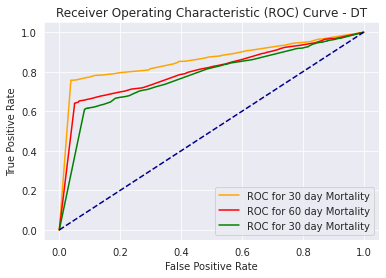

In [129]:
# Compute ROC curve and ROC area 
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.datasets import make_classification

def plot_roc_curve(fpr30, tpr30,fpr60, tpr60,fpr90, tpr90):
    plt.plot(fpr30, tpr30, color='orange', label='ROC for 30 day Mortality')
    plt.plot(fpr60, tpr60, color='red', label='ROC for 60 day Mortality')
    plt.plot(fpr90, tpr90, color='green', label='ROC for 30 day Mortality')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve - DT')
    plt.legend()
    plt.show()


#Plot of a ROC curve
data_X, class_label = make_classification(n_samples=1000, n_classes=2, weights=[1,1], random_state=1)

probs30 = classifier30.predict_proba(X_test30)
probs30 =probs30[:, 1]
auc30 = roc_auc_score(y_test30, probs30)
print('AUC for 30 days Mortality: %.2f' % auc30)
fpr30, tpr30, thresholds30 = roc_curve(y_test30, probs30)
probs60 = classifier60.predict_proba(X_test60)
probs60 =probs60[:, 1]
auc60 = roc_auc_score(y_test60, probs60)
print('AUC for 60 days Mortality: %.2f' % auc60)
fpr60, tpr60, thresholds60 = roc_curve(y_test60, probs60)
probs90 = classifier90.predict_proba(X_test90)
probs90 =probs90[:, 1]
auc90 = roc_auc_score(y_test90, probs90)
print('AUC for 90 days Mortality: %.2f' % auc90)
fpr90, tpr90, thresholds90 = roc_curve(y_test90, probs90)
plot_roc_curve(fpr30, tpr30,fpr60, tpr60,fpr90, tpr90)

## 30Days_60Days_90Days_Mortality_GridSearch

In [130]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
%matplotlib inline
sns.set_style('darkgrid')

from sklearn import preprocessing
from sklearn import utils

### KNeighborsClassifier

In [131]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()


In [132]:
x_train_std = ss.fit_transform(X_train30)
x_test_std = ss.transform(X_test30)

In [133]:
x_train60_std = ss.fit_transform(X_train60)
x_test60_std = ss.transform(X_test60)

In [134]:
x_train90_std = ss.fit_transform(X_train90)
x_test90_std = ss.transform(X_test90)

In [135]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

knn = KNeighborsClassifier()

param_grid = {'n_neighbors':[5,10,15,25,30,50.60,70]}

grid_knn = GridSearchCV(knn,param_grid,scoring='accuracy',cv = 8,refit = True)

In [136]:
grid_knn.fit(x_train_std,y_train30)
print("Best Score ==> ", grid_knn.best_score_)
print("Tuned Paramerers ==> ",grid_knn.best_params_)
print("Accuracy on Train set ==> ", grid_knn.score(x_train_std,y_train30))
print("Accuracy on Test set ==> ", grid_knn.score(x_test_std,y_test30))

Best Score ==>  0.8497713176951596
Tuned Paramerers ==>  {'n_neighbors': 25}
Accuracy on Train set ==>  0.850828729281768
Accuracy on Test set ==>  0.8513379583746283


In [137]:
grid_knn.fit(x_train60_std,y_train60)
print("Best Score ==> ", grid_knn.best_score_)
print("Tuned Paramerers ==> ",grid_knn.best_params_)
print("Accuracy on Train set ==> ", grid_knn.score(x_train60_std,y_train60))
print("Accuracy on Test set ==> ", grid_knn.score(x_test60_std,y_test60))

Best Score ==>  0.745860186179735
Tuned Paramerers ==>  {'n_neighbors': 30}
Accuracy on Train set ==>  0.7679558011049724
Accuracy on Test set ==>  0.7393458870168483


In [138]:
grid_knn.fit(x_train90_std,y_train90)
print("Best Score ==> ", grid_knn.best_score_)
print("Tuned Paramerers ==> ",grid_knn.best_params_)
print("Accuracy on Train set ==> ", grid_knn.score(x_train90_std,y_train90))
print("Accuracy on Test set ==> ", grid_knn.score(x_test90_std,y_test90))

Best Score ==>  0.742880025524641
Tuned Paramerers ==>  {'n_neighbors': 15}
Accuracy on Train set ==>  0.7734806629834254
Accuracy on Test set ==>  0.7507433102081269


### DecisionTreeClassifier

In [139]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()

param_grid = {'criterion':['gini','entropy'],'max_depth':np.arange(2,10),'min_samples_leaf':[0.2,0.4,0.6,0.8,0.9,1]}

grid_dtc = GridSearchCV(dtc,param_grid,scoring='accuracy',cv = 3,refit = True)

In [140]:
grid_dtc.fit(x_train_std,y_train30)
print("Best Score ==> ", grid_dtc.best_score_)
print("Tuned Paramerers ==> ",grid_dtc.best_params_)
print("Accuracy on Train set ==> ", grid_dtc.score(x_train_std,y_train30))
print("Accuracy on Test set ==> ", grid_dtc.score(x_test_std,y_test30))

Best Score ==>  0.8533806846511709
Tuned Paramerers ==>  {'criterion': 'gini', 'max_depth': 2, 'min_samples_leaf': 0.2}
Accuracy on Train set ==>  0.8533786655333616
Accuracy on Test set ==>  0.854806739345887


In [141]:
grid_dtc.fit(x_train60_std,y_train60)
print("Best Score ==> ", grid_dtc.best_score_)
print("Tuned Paramerers ==> ",grid_dtc.best_params_)
print("Accuracy on Train set ==> ", grid_dtc.score(x_train60_std,y_train60))
print("Accuracy on Test set ==> ", grid_dtc.score(x_test60_std,y_test60))

Best Score ==>  0.7407585803601237
Tuned Paramerers ==>  {'criterion': 'entropy', 'max_depth': 6, 'min_samples_leaf': 1}
Accuracy on Train set ==>  0.7526561835954101
Accuracy on Test set ==>  0.7289395441030724


In [142]:
grid_dtc.fit(x_train90_std,y_train90)
print("Best Score ==> ", grid_dtc.best_score_)
print("Tuned Paramerers ==> ",grid_dtc.best_params_)
print("Accuracy on Train set ==> ", grid_dtc.score(x_train90_std,y_train90))
print("Accuracy on Test set ==> ", grid_dtc.score(x_test90_std,y_test90))

Best Score ==>  0.7418189312053695
Tuned Paramerers ==>  {'criterion': 'entropy', 'max_depth': 6, 'min_samples_leaf': 1}
Accuracy on Train set ==>  0.7518062048448789
Accuracy on Test set ==>  0.7467789890981169


### Suppot Vector Classifier

In [143]:
from sklearn.svm import SVC

svc = SVC(probability=True)

param_grid = {'kernel':['rbf','linear'],'C':[0.01,0.1,1,0.001],'gamma':[0.1,0.01,0.2,0.4]}

grid_svc = GridSearchCV(svc,param_grid,scoring='accuracy',cv = 10,refit = True)

In [144]:
grid_svc.fit(x_train_std,y_train30)
print("Best Score ==> ", grid_svc.best_score_)
print("Tuned Paramerers ==> ",grid_svc.best_params_)
print("Accuracy on Train set ==> ", grid_svc.score(x_train_std,y_train30))
print("Accuracy on Test set ==> ", grid_svc.score(x_test_std,y_test30))

Best Score ==>  0.8538108144735059
Tuned Paramerers ==>  {'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}
Accuracy on Train set ==>  0.85401614959626
Accuracy on Test set ==>  0.8543111992071358


In [145]:
grid_svc.fit(x_train60_std,y_train60)
print("Best Score ==> ", grid_svc.best_score_)
print("Tuned Paramerers ==> ",grid_svc.best_params_)
print("Accuracy on Train set ==> ", grid_svc.score(x_train60_std,y_train60))
print("Accuracy on Test set ==> ", grid_svc.score(x_test60_std,y_test60))

Best Score ==>  0.7475629037358269
Tuned Paramerers ==>  {'C': 1, 'gamma': 0.4, 'kernel': 'rbf'}
Accuracy on Train set ==>  0.753931151721207
Accuracy on Test set ==>  0.7517343904856293


In [146]:
grid_svc.fit(x_train90_std,y_train90)
print("Best Score ==> ", grid_svc.best_score_)
print("Tuned Paramerers ==> ",grid_svc.best_params_)
print("Accuracy on Train set ==> ", grid_svc.score(x_train90_std,y_train90))
print("Accuracy on Test set ==> ", grid_svc.score(x_test90_std,y_test90))

Best Score ==>  0.7426674797849755
Tuned Paramerers ==>  {'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}
Accuracy on Train set ==>  0.742668933276668
Accuracy on Test set ==>  0.7487611496531219


In [147]:
from sklearn.ensemble import VotingClassifier

classifiers = [('knn',grid_knn),('tree',grid_dtc),('svc',grid_svc)]

vtc = VotingClassifier(classifiers)

### Random Forest Classifier

In [148]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

for i in range(2,7):
    rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=i, verbose=0)
    rfe.fit(x_train_std,y_train30)
    print(f"Accuracy with Feature {i} ==>",metrics.accuracy_score(y_test30, rfe.predict(x_test_std)))

Accuracy with Feature 2 ==> 0.854806739345887
Accuracy with Feature 3 ==> 0.8434093161546086
Accuracy with Feature 4 ==> 0.8265609514370664
Accuracy with Feature 5 ==> 0.8230921704658077
Accuracy with Feature 6 ==> 0.8225966303270565


In [149]:
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=5, verbose=0)
rfe.fit(x_train_std,y_train30)

RFE(estimator=RandomForestClassifier(), n_features_to_select=5)

In [150]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()

param_grid = {'n_estimators':[200,500,1000],
              'max_depth':[2,3,4,5],
              'min_samples_leaf':[0.2,0.4,0.6,0.8,1],
              'max_features':['auto','sqrt'],
              'criterion':['gini','entropy']}

grid_rfc = RandomizedSearchCV(rfc,param_grid,n_iter=20,scoring='accuracy',cv = 10,refit = True)

In [ ]:
grid_rfc.fit(x_train_std,y_train30)
print("Best Score ==> ", grid_rfc.best_score_)
print("Tuned Paramerers ==> ",grid_rfc.best_params_)
print("Accuracy on Train set ==> ", grid_rfc.score(x_train_std,y_train30))
print("Accuracy on Test set ==> ", grid_rfc.score(x_test_std,y_test30))

In [ ]:
grid_rfc.fit(x_train_std,y_train60)
print("Best Score ==> ", grid_rfc.best_score_)
print("Tuned Paramerers ==> ",grid_rfc.best_params_)
print("Accuracy on Train set ==> ", grid_rfc.score(x_train_std,y_train60))
print("Accuracy on Test set ==> ", grid_rfc.score(x_test_std,y_test60))

In [ ]:
grid_rfc.fit(x_train_std,y_train90)
print("Best Score ==> ", grid_rfc.best_score_)
print("Tuned Paramerers ==> ",grid_rfc.best_params_)
print("Accuracy on Train set ==> ", grid_rfc.score(x_train_std,y_train90))
print("Accuracy on Test set ==> ", grid_rfc.score(x_test_std,y_test90))

In [ ]:
### XGBClassifier

In [ ]:
import xgboost as xgb

xgbcl = xgb.XGBClassifier()

param_grid = {'booster':['gbtree','gblinear'],
             'colsample_bytree':[0.4,0.6,0.8,1],
             'learning_rate':[0.01,0.1,0.2,0.4],
             'max_depth':[2,3,4,6],
             'n_estimators':[200,300,400,500],
              'subsample':[0.4,0.6,0.8,1]}

grid_xgb = RandomizedSearchCV(xgbcl,param_grid,n_iter=30,scoring='accuracy',cv = 10,refit = True)

In [ ]:
grid_xgb.fit(x_train_std,y_train30)
print("Best Score ==> ", grid_xgb.best_score_)
print("Tuned Paramerers ==> ",grid_xgb.best_params_)
print("Accuracy on Train set ==> ", grid_xgb.score(x_train_std,y_train30))
print("Accuracy on Test set ==> ", grid_xgb.score(x_test_std,y_test30))

In [ ]:
grid_xgb.fit(x_train_std,y_train60)
print("Best Score ==> ", grid_xgb.best_score_)
print("Tuned Paramerers ==> ",grid_xgb.best_params_)
print("Accuracy on Train set ==> ", grid_xgb.score(x_train_std,y_train60))
print("Accuracy on Test set ==> ", grid_xgb.score(x_test_std,y_test60))

In [ ]:
grid_xgb.fit(x_train_std,y_train90)
print("Best Score ==> ", grid_xgb.best_score_)
print("Tuned Paramerers ==> ",grid_xgb.best_params_)
print("Accuracy on Train set ==> ", grid_xgb.score(x_train_std,y_train90))
print("Accuracy on Test set ==> ", grid_xgb.score(x_test_std,y_test90))